# Basic MNIST Model
For testing the **NodeAnalysis** python library

In [1]:
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation
from keras.utils import np_utils
from keras.datasets import mnist

from sklearn.preprocessing import LabelEncoder

from nodeanalysis.GetWeights import GetWeights as GW
from nodeanalysis.GetWeights import print_node_params
from nodeanalysis.NodeAnalysis import NodeAnalysisCallback as nac

Using TensorFlow backend.


## MNIST Dataset 
### Load Dataset

In [2]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()

In [3]:
print(f'X_train.shape = {X_train.shape}')
print(f'y_train.shape = {y_train.shape}')
print(f'X_test.shape = {X_test.shape}')
print(f'y_test.shape = {y_test.shape}')

X_train.shape = (60000, 28, 28)
y_train.shape = (60000,)
X_test.shape = (10000, 28, 28)
y_test.shape = (10000,)


### Pre-Processing
#### Normalization

In [4]:
X_train = X_train / 255
X_test = X_test / 255

print(f'sample X_train: \n{X_train[0][:5][:5]}\n')
print(f'sample X_test: \n{X_test[0][:5][:5]}')

sample X_train: 
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]]

sample X_test: 
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]]


#### Label Encoding

In [5]:
encoder = LabelEncoder()
encoder.fit(y_train)

y_train_encoded = encoder.transform(y_train)
y_classes = encoder.classes_
y_n = len(y_classes)

print(f'sample y_train_encoded = {y_train_encoded[:5]}')
print(f'classes = {y_classes} n = {y_n}')

sample y_train_encoded = [5 0 4 1 9]
classes = [0 1 2 3 4 5 6 7 8 9] n = 10


## Model
### Create Model

In [6]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28, 1)),
  tf.keras.layers.Dense(128,activation='relu'),
  tf.keras.layers.Dense(10, activation='softmax')
])
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(0.001),
    metrics=['accuracy'],
)

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
dense (Dense)                (None, 128)               100480    
_________________________________________________________________
dense_1 (Dense)              (None, 10)                1290      
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
_________________________________________________________________


### Train Model 

#### NodeAnalysis Callback

In [7]:
gw = nac()

#### Train Model

In [8]:
history = model.fit(X_train, y_train,
        batch_size=128,
         epochs=20,
         validation_data=(X_test,y_test),
         callbacks=[gw])

Epoch 1/20
469/469 [==============================] - 2s 4ms/step - loss: 0.3569 - accuracy: 0.9025 - val_loss: 0.1922 - val_accuracy: 0.9452
Epoch 2/20
469/469 [==============================] - 2s 4ms/step - loss: 0.1660 - accuracy: 0.9522 - val_loss: 0.1393 - val_accuracy: 0.9584
Epoch 3/20
469/469 [==============================] - 2s 4ms/step - loss: 0.1198 - accuracy: 0.9660 - val_loss: 0.1133 - val_accuracy: 0.9655
Epoch 4/20
469/469 [==============================] - 2s 4ms/step - loss: 0.0920 - accuracy: 0.9727 - val_loss: 0.0954 - val_accuracy: 0.9708
Epoch 5/20
469/469 [==============================] - 2s 4ms/step - loss: 0.0742 - accuracy: 0.9783 - val_loss: 0.0846 - val_accuracy: 0.9730
Epoch 6/20
469/469 [==============================] - 2s 4ms/step - loss: 0.0596 - accuracy: 0.9830 - val_loss: 0.0779 - val_accuracy: 0.9750
Epoch 7/20
469/469 [==============================] - 2s 4ms/step - loss: 0.0502 - accuracy: 0.9859 - val_loss: 0.0799 - val_accuracy: 0.9742
Epoch 

#### Test NodeAnalysis

In [9]:
#print(gw.weight_dict[gw.layer_names[-1]]["weights"].shape)

#node on output layer (-1) with [1,1] 
#last epoch
node1 = gw.getNodeHistory(-1,[1,1])
node1[0].report()

NODE [name=Node #[1, 1] epoch=0]
	 model=<tensorflow.python.keras.engine.sequential.Sequential object at 0x00000251F1F08B50>
	 layer=<tensorflow.python.keras.layers.core.Dense object at 0x00000251F1F08820>

	 layer_in = <tensorflow.python.keras.layers.core.Dense object at 0x00000251F1F08490>
	 layer_out = None

	 weight = 0.08306076377630234
	 bias = 0.02814280427992344
	 activation = [<function softmax at 0x00000251DEE34820>]

IN DEVELOPMENT
	 operation_in = None
	 operation_out = None
	 input_nodes = 0
	 output_nodes = 0


## Test Node Analysis
### Operations

In [10]:
gw.nnlayer_names

['dense', 'dense_1']

In [11]:
gw.layer_names

['flatten', 'dense', 'dense_1']

In [12]:
node = gw.getNode(0,[1,1])
index_in = -1
index_out = -1
for x in range(len(gw.layer_names)):
    
    if node.layer_in == None:
        index_in = -1
    elif node.layer_in.name == gw.layer_names[x]:
        index_in = x

    if(node.layer_out == None):
        index_out = len(gw.layer_names)
    elif node.layer_out.name == gw.layer_names[x]:
        index_out = x

ops= list(range(index_in, index_out))
print(ops)

[-1, 0, 1]


### visualization

In [13]:
from nodeanalysis import NodeVis as nv

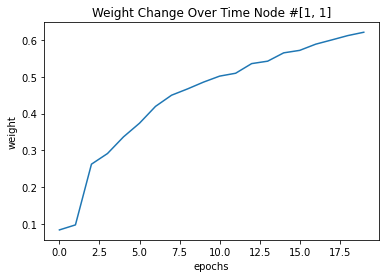

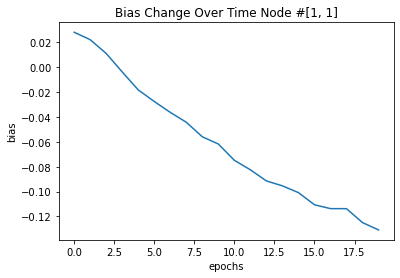

In [14]:
nv.showWeightsA(node1)
nv.showBiasA(node1)

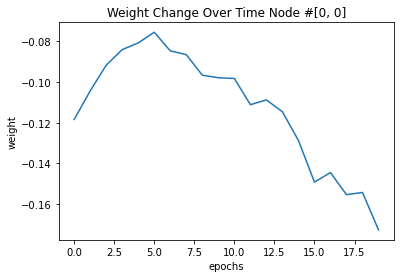

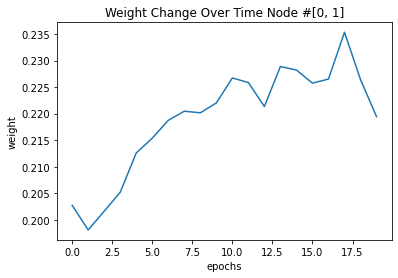

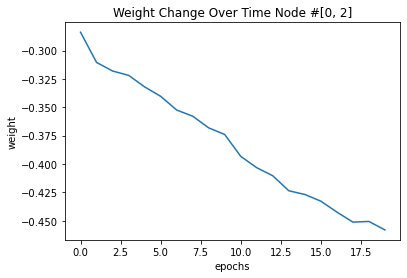

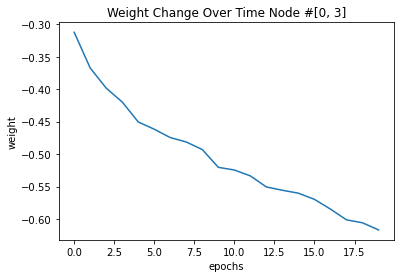

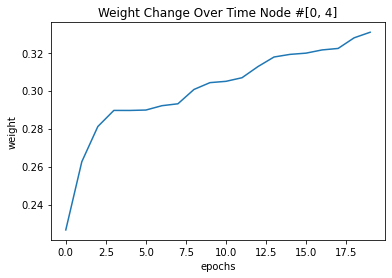

...

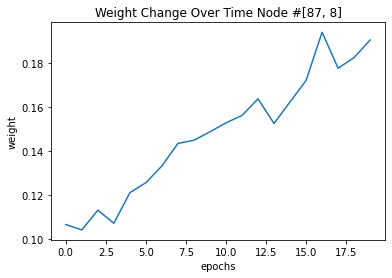

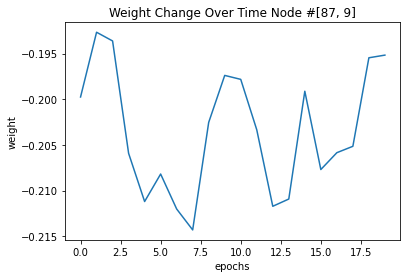

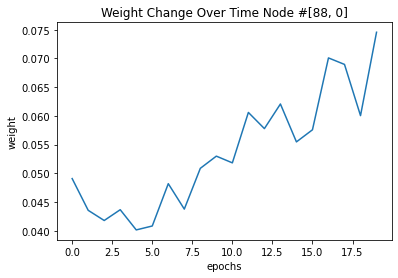

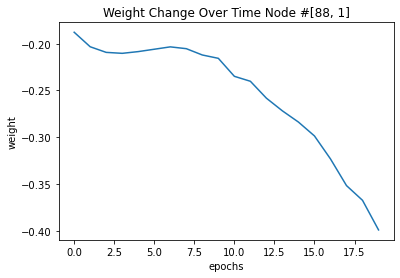

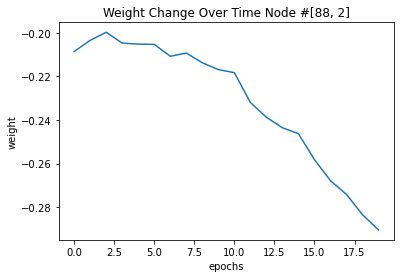

KeyboardInterrupt: 

In [22]:
size = gw.weight_dict['dense_1']['weights'].shape[1:]
for x in range(0,size[0]):
    for y in range (0, size[1]):
        nv.showWeightsB(gw,-1,[x,y])
        #nv.showBiasB(gw,-1,[x,y])